# The market of catering establishments in Moscow

## Project Description
---

**Investors from the "Shut Up and Take My Money" fund** have decided to open a public catering establishment in Moscow.

**The clients are not sure about the direction of the establishment** (cafe, restaurant, pizzeria, pub, or bar), its location, and pricing.

**The task is to prepare a market research of the public catering industry in Moscow, find interesting features, and present the obtained results that will help in the future to choose a suitable location for investors.**

**A dataset of public catering establishments in Moscow is available, compiled based on data from Yandex Maps and Yandex Business as of the summer of 2022.**

* The information placed in the Yandex Business service could have been added by users or found in publicly available sources. It is purely for reference purposes.

## Data Description
---

**File `moscow_places.csv`**:
* `name` — establishment name;
* `address` — establishment address;
* `category` — establishment category, for example, "cafe," "pizzeria," or "coffee shop";
* `hours` — information about days and hours of operation;
* `lat` — latitude of the geographical point where the establishment is located;
* `lng` — longitude of the geographical point where the establishment is located;
* `rating` — establishment rating based on user ratings in Yandex Maps (highest rating is 5.0);
* `price` — price category in the establishment, for example, "average," "below average," "above average," and so on;
* `avg_bill` — a string that stores the average order cost in the form of a range, for example:
 * "Average bill: 1000–1500 ₽";
 * "Cappuccino price: 130–220 ₽";
 * "Beer glass price: 400–600 ₽".
* `middle_avg_bill` — a number representing the estimated average bill, which is only indicated for values from the `avg_bill` column that start with the substring "Average bill":
 * If the string contains a price range of two values, the median of these two values will be included in the column.
 * If the string contains a single number — a price without a range, that number will be included in the column.
 * If there is no value or it does not start with the substring "Average bill," the column will be empty.
* `middle_coffee_cup` — a number representing the estimated price of one cup of cappuccino, which is only indicated for values from the `avg_bill` column that start with the substring "Cappuccino price":
 * If the string contains a price range of two values, the median of these two values will be included in the column.
 * If the string contains a single number — a price without a range, that number will be included in the column.
 * If there is no value or it does not start with the substring "Cappuccino price," the column will be empty.
* `chain` — a number expressed as 0 or 1, indicating whether the establishment is part of a chain (there may be errors for small chains):
 * 0 — the establishment is not part of a chain
 * 1 — the establishment is part of a chain
* `district` — administrative district in which the establishment is located, for example:
 * Central Administrative District;
* `seats` — number of seating places.

## Loading Data and Exploring General Information
---

### Lilbraries
---

In [89]:
#importing lib-s and preferences
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
import numpy as np
import matplotlib.ticker as ticker
import scipy as sc
import datetime as dt
from datetime import datetime, timedelta
import scipy.stats as stats
pd.set_option('display.max_columns', None) #for displaying all columns
pd.set_option('display.max_colwidth', None) #for displaying full widht of columns
from plotly import graph_objects as go
import plotly.express as px
from scipy import stats as st
import math as mth
import json # module for JSON
from folium import Map, Choropleth, Marker # importing map, choropleth, and markers.
from folium.plugins import MarkerCluster # importing cluster

### Functions
---

In [90]:
#function, which shows head, tail, info, description, duplicates, counts Nan's and etc. of DF

def starting_pack(data):
    print('Main info about dataframe:')
    data.info()
    print()
    print('First rows of DF:')
    display(data.head())
    print('Last rows of DF:')
    display(data.tail())
    print('Number of duplicates:')
    display(data.duplicated().sum())
    print('Number of nans:')
    display(data.isna().sum())
    print('Description:')
    display(data.describe())

### Dataset loading
---

In [91]:
#openning file with data from common directory
data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

### Data exploration
---

In [92]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [93]:
starting_pack(data)

Main info about dataframe:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB

First rows of DF:


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Last rows of DF:


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0


Number of duplicates:


0

Number of nans:


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Description:


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


1288 seating places. A whole stadium. Let's take a closer look at the distribution.

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64


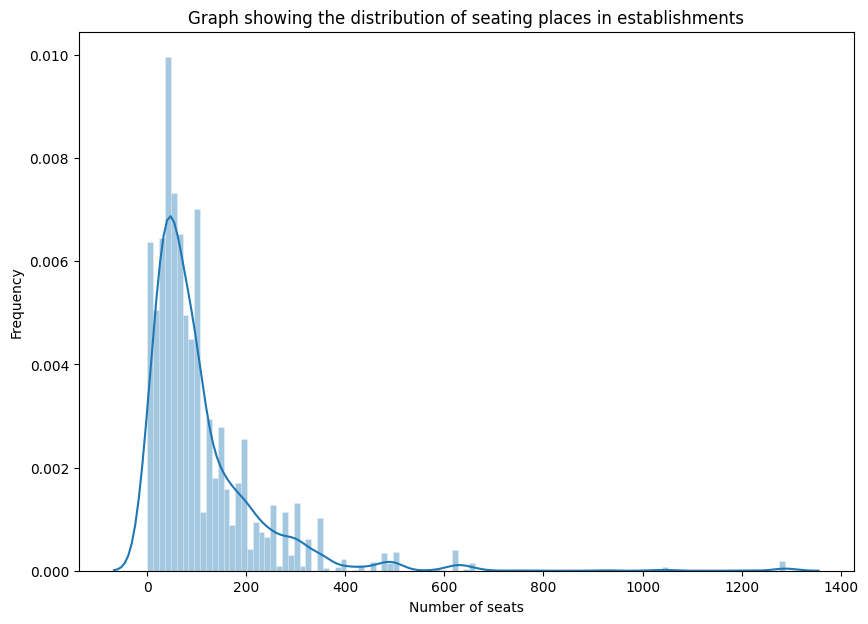

In [94]:
print(data['seats'].describe())
plt.figure(figsize=(10, 7))
plt.title('Graph showing the distribution of seating places in establishments')
sns.histplot(
    data['seats'], kde=True,
    stat="density", kde_kws=dict(cut=3),
    alpha=.4, edgecolor=(1, 1, 1, .4),
);
plt.xlabel('Number of seats')
plt.ylabel('Frequency');

It's noticeable from the graph and table that 75% of the establishments have up to 140 seats. We will revisit this analysis during the data preprocessing stage.

To make it easier to find implicit duplicates, let's change the titles to lowercase.

In [95]:
data['name'] = data['name'].str.lower()

In [96]:
print('Number of unique venue names:',data['name'].nunique())
print('Duplicates:',data.duplicated().sum())


Number of unique venue names: 5512
Duplicates: 0


In [97]:
data.groupby('name').agg({'address':'count'}).sort_values(by='address',ascending=False).head(20)

,address
name,
кафе,189
шоколадница,120
домино'с пицца,77
додо пицца,74
one price coffee,72
яндекс лавка,69
cofix,65
prime,50
хинкальная,44


At first glance, there are no implicit duplicates, but there are venue names that are similar to the category of the venue itself. Let's take a closer look at them.

In [98]:
categories = data['category'].unique()
print('Categories:',categories)

Categories: ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


In [99]:
data.query('name in @categories')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
40,кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN
47,кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,NaN,NaN,0,35.0
108,кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
123,кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897794,37.591395,4.3,NaN,NaN,NaN,NaN,0,50.0
141,кафе,кафе,"Москва, Дубнинская улица, 52, стр. 1",Северный административный округ,"ежедневно, 10:00–20:00",55.896020,37.556072,3.9,NaN,NaN,NaN,NaN,0,70.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7931,кафе,кафе,"Москва, Каширское шоссе, 67А",Южный административный округ,NaN,55.596680,37.725980,4.0,NaN,NaN,NaN,NaN,0,NaN
7938,кафе,кафе,"Москва, улица Генерала Белова, 28, корп. 1",Южный административный округ,NaN,55.604990,37.724762,4.5,NaN,NaN,NaN,NaN,0,NaN
7945,кафе,кафе,"Москва, МКАД, 19-й километр, вл20с1",Южный административный округ,NaN,55.621773,37.781727,4.0,NaN,NaN,NaN,NaN,0,NaN
7976,кафе,кафе,"Москва, МКАД, 19-й километр, вл12с1",Южный административный округ,NaN,55.616980,37.779312,4.3,NaN,NaN,NaN,NaN,0,NaN


Yes, such "unnamed" venues are possible.

**It's interesting that row 108: a venue named "Cafe" that is actually a bar/pub has no seating capacity and no specified working hours.**

I assume that from the dataframe, we can remove rows where there are missing values simultaneously for working hours, seating capacity, price category, and average bill. Such missing values might have occurred during data addition from the Yandex Business service, and they likely contain errors.

Let's take a closer look at such rows.

In [100]:
empty = data.query('hours.isna() and price.isna() and avg_bill.isna() and seats.isna()')
empty

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,ижора,булочная,"Москва, Ижорский проезд, 5А",Северный административный округ,NaN,55.888366,37.514856,4.4,NaN,NaN,NaN,NaN,0,NaN
40,кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN
56,рыба из тандыра,быстрое питание,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.888010,37.515960,1.5,NaN,NaN,NaN,NaN,0,NaN
108,кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
126,кулинария,кафе,"Москва, Череповецкая улица, 17",Северо-Восточный административный округ,NaN,55.898741,37.585301,3.9,NaN,NaN,NaN,NaN,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8206,чайхана аксы,кафе,"Москва, Волгоградский проспект, 32, корп. 12",Юго-Восточный административный округ,NaN,55.721600,37.693002,4.1,NaN,NaN,NaN,NaN,0,NaN
8228,волчок,кафе,"Москва, проспект Андропова, 18, корп. 9",Южный административный округ,NaN,55.691734,37.660548,4.6,NaN,NaN,NaN,NaN,0,NaN
8236,1у,кафе,"Москва, Нагатинская набережная, 40/1к1",Южный административный округ,NaN,55.685528,37.673546,3.4,NaN,NaN,NaN,NaN,0,NaN
8375,улица гурьянова 55,кафе,"Москва, улица Гурьянова, 55",Юго-Восточный административный округ,NaN,55.679981,37.717034,4.5,NaN,NaN,NaN,NaN,0,NaN


There are 235 rows with missing values for working hours, seating capacity, and average bill.

In [101]:
print('The number of unique values in the working hours column:',data['hours'].nunique())

The number of unique values in the working hours column: 1307


In [102]:
data.query('hours == "ежедневно, круглосуточно"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
10,great room bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0
17,чайхана беш-бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0
19,пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN
24,drive café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN
49,2u-ту-ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8394,намангале,кафе,"Москва, Ферганская улица, вл17-21",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.705332,37.819244,4.3,NaN,NaN,NaN,NaN,0,NaN
8399,"пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


There are 730 venues with round-the-clock working hours.

In [103]:
print('Venues without working hours:',data['hours'].isna().sum())

Venues without working hours: 536


**Conclusion**

1.   There are no duplicates, implicit duplicates have been investigated;
2.   There are missing values - 235 rows without necessary data, but further removal is not obvious;
3.   Ratings of establishments on a five-point scale;
4.   The number of establishments in the dataframe is 8405;
5.   The number of unique establishment names is 5512;
6.   Establishments with "no unique name" - 270;
7.   Establishments without specified working hours - 536;
8.   The maximum number of seats is 1288 - this might be an outlier. 75% of establishments have up to 140 seats.

## Data preprocessing
---

Let's return to the establishments without specified working hours, seating capacity, and average bill.

In [104]:
empty = empty.index.tolist()

In [105]:
print('Rows without working hours, seating capacity, and average bill:',len(empty))
print('Data loss while filtering, %:', (1-len(data.query("index not in @empty"))/len(data)))

Rows without working hours, seating capacity, and average bill: 235
Data loss while filtering, %: 0.02795622174637169


Let's remove such rows from the dataframe.

In [106]:
data = data.query("index not in @empty")

Let's create a column named "street".

In [107]:
splitted = []
for adress in data['address']:
  adress = adress.split(', ') #splitting ", " -> city/street/building/extra
  splitted.append(adress[1]) #adding (street) to list

data['street'] = splitted

<ipython-input-107-330a5ba736f6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['street'] = splitted


Let's create a column named "is_24_7" to indicate whether the establishment operates 24/7.

In [108]:
data['is_24_7'] = np.where(data['hours'] == "ежедневно, круглосуточно", True, False)

Let's take a closer look at the situation with seating capacity. Having 0 seating capacity is a possible scenario, considering that an establishment could operate solely for delivery (e.g., Yandex.Eats), offer takeout options, and more. We will examine establishments with reported seating capacity, categorized by the chain status, to identify any outliers.

Let's observe this distribution using a box plot.

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64


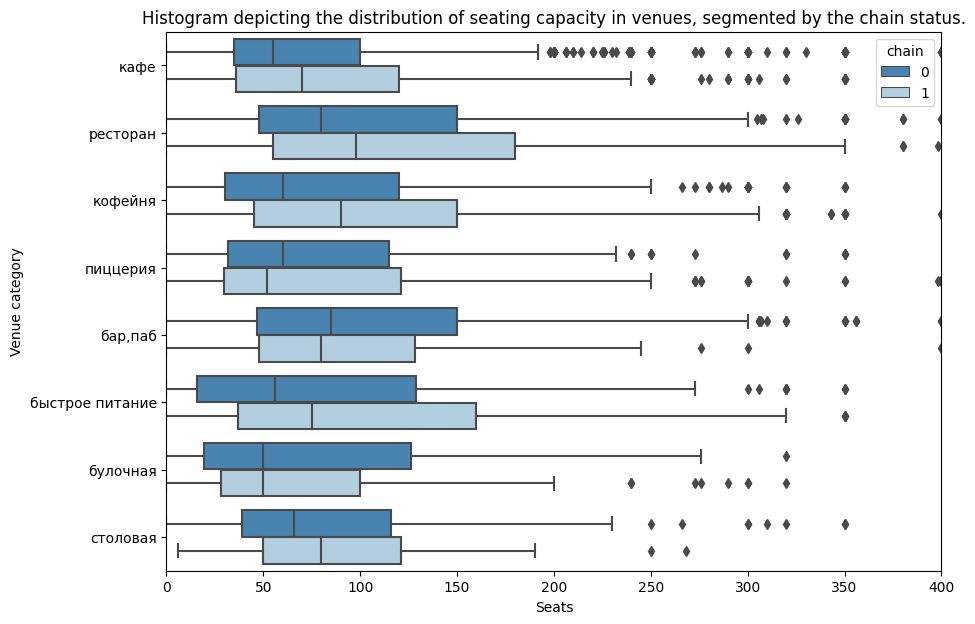

In [109]:
print(data['seats'].describe())

sns.color_palette("Blues", as_cmap=True)
#OXY, Title names

plt.figure(figsize=(10, 7))
plt.title('Histogram depicting the distribution of seating capacity in venues, segmented by the chain status.')
sns.boxplot(x='seats',y='category',hue='chain', data=data, palette='Blues_r')
plt.xlim(0,400)
plt.xlabel('Seats')
plt.ylabel('Venue category');

An interesting distribution: after 250 seats, there are obvious outliers, as the values are concentrated in a single column. Let's limit the dataframe to a maximum of 250 seats and take another look.

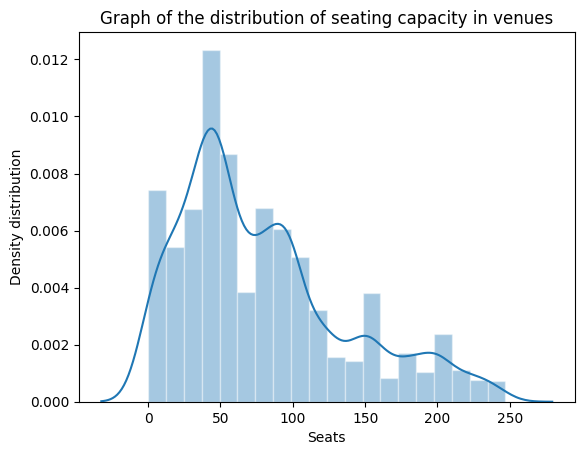

In [110]:
#OXY, Title names
plt.ylabel('Density distribution')
plt.title('Graph of the distribution of seating capacity in venues')

sns.histplot(
    data.query('seats < 250')['seats'], bins=20, kde=True,
    stat="density", kde_kws=dict(cut=3),
    alpha=.4, edgecolor=(1, 1, 1, .4),
);

plt.xlabel('Seats');

count    4324.000000
mean       78.242137
std        57.435010
min         0.000000
25%        40.000000
50%        60.000000
75%       100.000000
max       247.000000
Name: seats, dtype: float64


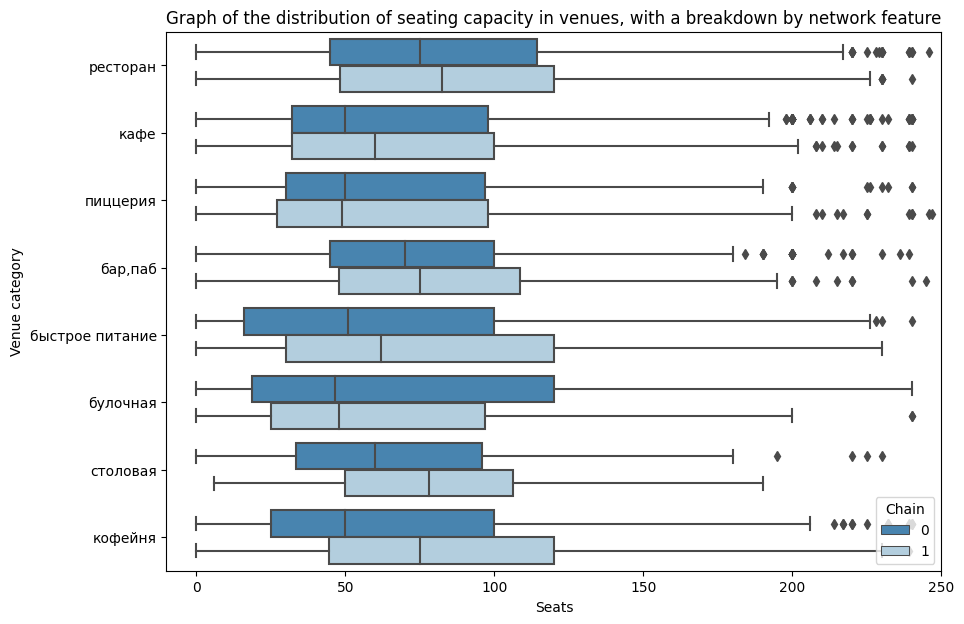

In [111]:
print(data.query('seats < 250')['seats'].describe())

sns.color_palette("Blues", as_cmap=True)
#OXY, Title names

plt.figure(figsize=(10, 7))
plt.title('Graph of the distribution of seating capacity in venues, with a breakdown by network feature')
sns.boxplot(x='seats',y='category',hue='chain', data=data.query('seats < 250'), palette='Blues_r')
plt.xlim(-10,250)
plt.xlabel('Seats')
plt.ylabel('Venue category')
plt.legend(loc='lower right', title='Chain');

In [112]:
print('Venues with seating capacity exceeding 250:',data.query('seats > 250')['name'].count())
print('Data loss after filtering, %:', round(data.query('seats > 250')['name'].count()/data['name'].count()*100,2))

Venues with seating capacity exceeding 250: 400
Data loss after filtering, %: 4.9


We will filter out establishments beyond the top 5% to avoid significant distortion of the data.

In [113]:
data_to_much = data.query('seats > 250')
data_to_much

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
127,арарат,кафе,"Москва, Дмитровское шоссе, 165, корп. 1",Северо-Восточный административный округ,"ежедневно, 06:00–20:00",55.914310,37.538953,4.2,NaN,NaN,NaN,NaN,1,350.0,Дмитровское шоссе,False
171,one price coffee,кофейня,"Москва, Дмитровское шоссе, 163А, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.909838,37.541526,4.0,NaN,NaN,NaN,NaN,1,350.0,Дмитровское шоссе,False
176,вуди пицца,пиццерия,"Москва, Дмитровское шоссе, 107А, корп. 1",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.878504,37.540110,4.0,средние,Средний счёт:400–600 ₽,500.0,NaN,0,350.0,Дмитровское шоссе,False
194,ленкорань,кафе,"Москва, Дмитровское шоссе, 165, корп. 1",Северо-Восточный административный округ,"ежедневно, 06:00–20:00",55.914574,37.539103,1.4,NaN,NaN,NaN,NaN,0,350.0,Дмитровское шоссе,False
216,грузинский бульвар,быстрое питание,"Москва, Дмитровское шоссе, 163А, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.909115,37.540112,4.0,NaN,NaN,NaN,NaN,0,350.0,Дмитровское шоссе,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8198,милти,быстрое питание,"Москва, улица Ленинская Слобода, 19",Южный административный округ,пн-пт 09:00–19:00,55.708303,37.652822,3.8,NaN,NaN,NaN,NaN,0,450.0,улица Ленинская Слобода,False
8220,шеф гирос,быстрое питание,"Москва, проспект Андропова, 22",Южный административный округ,"ежедневно, 09:00–22:00",55.682823,37.661115,4.2,NaN,Средний счёт:250–350 ₽,300.0,NaN,0,300.0,проспект Андропова,False
8237,pasta cup & pinsa,пиццерия,"Москва, Автозаводская улица, 18",Южный административный округ,"ежедневно, 10:00–22:00",55.704647,37.639556,3.5,средние,Средний счёт:450–700 ₽,575.0,NaN,0,455.0,Автозаводская улица,False
8315,чайхана бишкек,ресторан,"Москва, Тихорецкий бульвар, 2, корп. 1",Юго-Восточный административный округ,"ежедневно, 09:00–01:30",55.679190,37.776553,4.1,NaN,NaN,NaN,NaN,0,305.0,Тихорецкий бульвар,False


In [114]:
data_to_much = data_to_much.index.tolist()
data_new = data.query("index not in @data_to_much")
data_new.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,7771.000000,7771.000000,7771.000000,2961.000000,511.000000,7771.000000,4395.000000
mean,55.750525,37.609393,4.237872,949.013847,175.046967,0.382576,81.016837
std,0.069513,0.098101,0.460983,1021.628405,89.959957,0.486047,60.946384
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705447,37.539789,4.100000,375.000000,125.000000,0.000000,40.000000
50%,55.754670,37.606618,4.300000,700.000000,169.000000,0.000000,64.000000
75%,55.795096,37.665408,4.400000,1250.000000,225.000000,1.000000,107.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,250.000000


In [115]:
data_new['address'] = data_new['address'].str.lower()
name_and_address_dub = data_new[data_new.duplicated(subset=['name','address'])]
name_and_address_dub

<ipython-input-115-50cc13e9085f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_new['address'] = data_new['address'].str.lower()


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN,парк Ангарские пруды,False
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,Волоколамское шоссе,False
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,проспект Мира,False


Yes, duplicates were found in the name-address pair. Fortunately, there are only 3 rows with such duplicates. Remove them.

In [116]:
data_new = data_new.drop_duplicates(subset=['name','address'], keep='first')
data_new = data_new.reset_index(drop=True)
data_new

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7763,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
7764,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
7765,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
7766,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


**Conclusion**


1.   A column with street names has been created;
2.   A categorical column reflecting the 24/7 operating mode has been created;
3.   An upper limit of 250 seats has been set for the analyzed data;
4.   Rows with missing values in columns for working hours, average bill, and number of seats have been removed;
5.   Implicit duplicates in the name-address pair have been removed.

## **EDA**
---


### Categories of Venues
---
How are the establishments distributed across categories?

In [117]:
by_category = (data_new
               .groupby('category')
               .agg({'name':'count'})
               .rename(columns = {'name':'count'})
               .sort_values(by='count',ascending=False)
               .reset_index()
)
by_category['percentage'] = round(by_category['count']/by_category['count'].sum()*100,2)
by_category

,category,count,percentage
0,кафе,2116,27.24
1,ресторан,1898,24.43
2,кофейня,1334,17.17
3,"бар,паб",709,9.13
4,пиццерия,605,7.79
5,быстрое питание,565,7.27
6,столовая,301,3.87
7,булочная,240,3.09


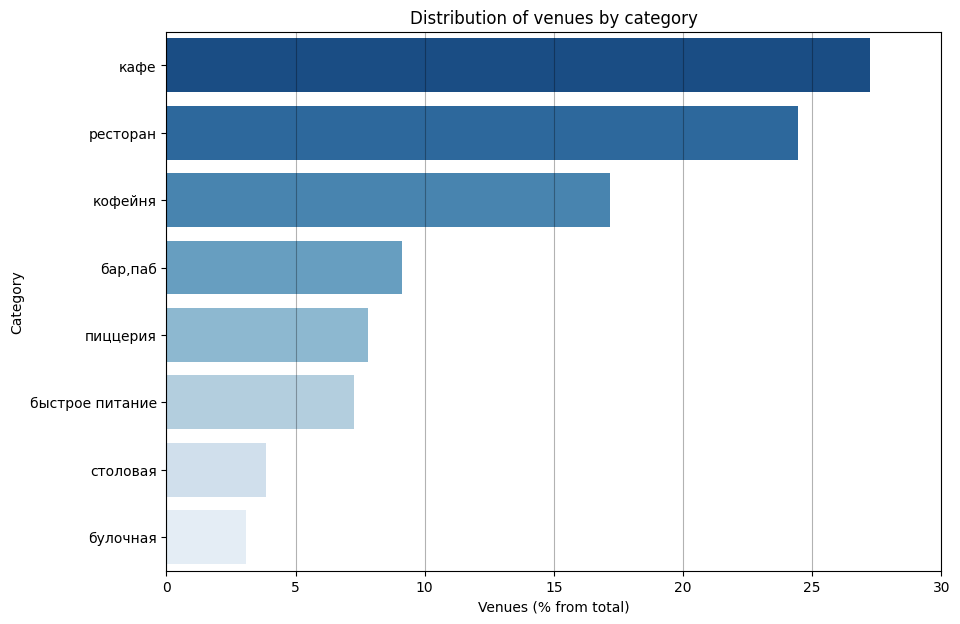

In [118]:
plt.figure(figsize=(10, 7))
sns.barplot(x='percentage', y='category', data=by_category, orient='h',palette='Blues_r', alpha=1)
plt.title('Distribution of venues by category')
plt.xlabel('Venues (% from total)')
plt.ylabel('Category')
plt.xlim(0,30)
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x')
plt.show()

**Conclusion**

1. There are a total of 7 types of establishments.
2. The top categories in terms of quantity are cafes, restaurants, and coffee shops.

### Seats
---

,category,count,seats
0,ресторан,1898,104954.0
1,кафе,2116,84660.0
2,кофейня,1334,55102.0
3,"бар,паб",709,36167.0
4,пиццерия,605,29552.0
5,быстрое питание,565,24156.0
6,столовая,301,11642.0
7,булочная,240,9498.0


,category,count,seats
0,ресторан,1898,80.0
1,"бар,паб",709,74.5
2,кофейня,1334,65.0
3,столовая,301,64.0
4,быстрое питание,565,56.0
5,кафе,2116,52.5
6,пиццерия,605,50.0
7,булочная,240,48.0


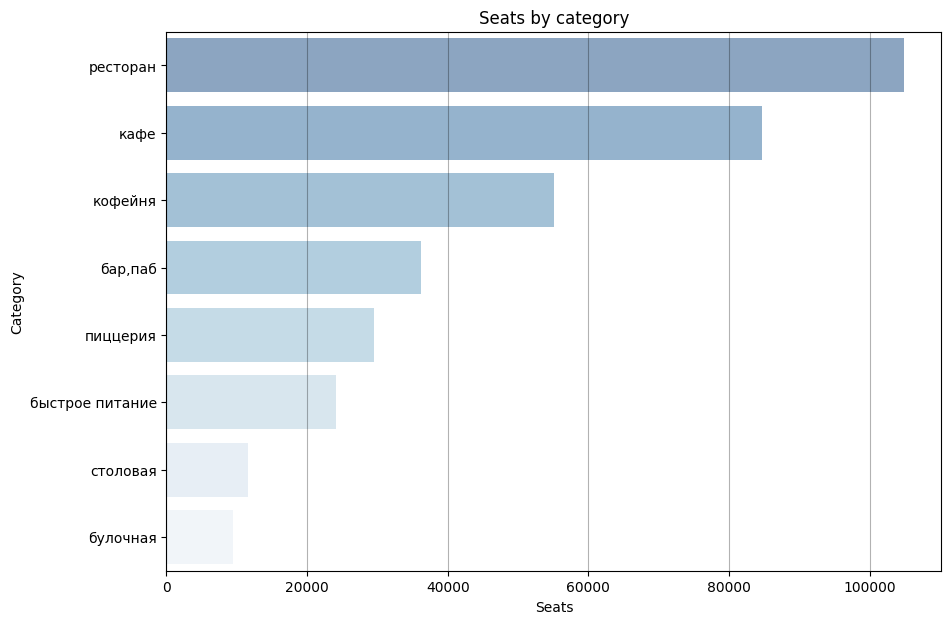

In [119]:
by_seats_sum = (data_new
            .groupby('category')
            .agg({'name':'count', 'seats':'sum'})
            .rename(columns = {'name':'count'})
            .sort_values(by='seats',ascending=False)
            .reset_index())
display(by_seats_sum)

by_seats_median = (data_new
            .groupby('category')
            .agg({'name':'count', 'seats':'median'})
            .rename(columns = {'name':'count'})
            .sort_values(by='seats',ascending=False)
            .reset_index())
display(by_seats_median)

plt.figure(figsize=(10, 7))

ax1 = sns.barplot(x='seats', y='category', data=by_seats_sum, orient='h',palette='Blues_r', alpha=0.5)
ax1.set_title('Seats by category')
ax1.set_xlabel('Seats')
ax1.set_ylabel('Category')
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x')
plt.show()


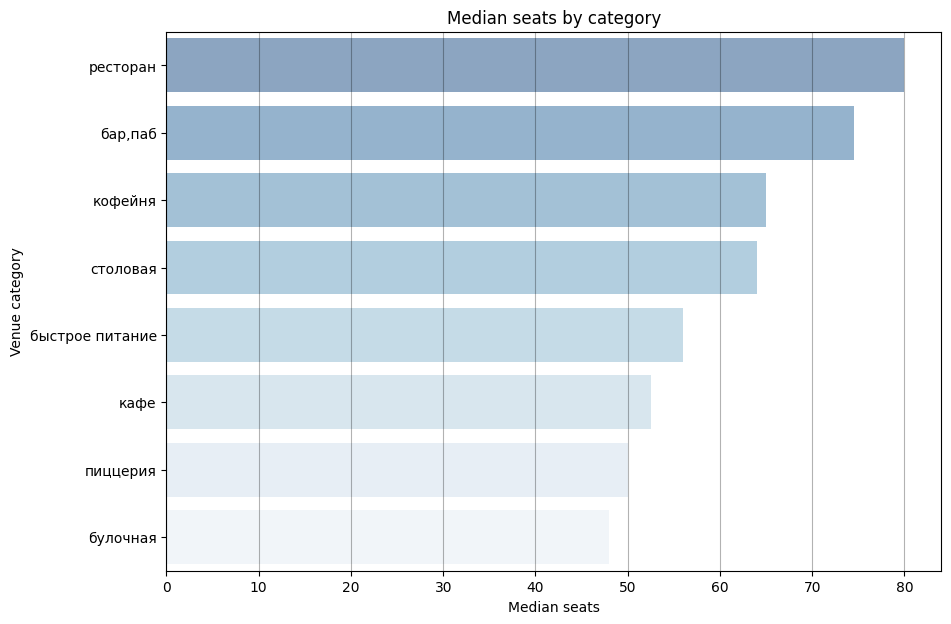

In [120]:
plt.figure(figsize=(10, 7))
ax2 = sns.barplot(x='seats', y='category', data=by_seats_median, orient='h',palette='Blues_r', alpha=0.5)
ax2.set_title('Median seats by category')
ax2.set_xlabel('Median seats')
ax2.set_ylabel('Venue category')
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x');

**Conclusion**

1. More venues typically correspond to more seating capacity.
2. It's interesting to note that the median seating capacity ranges from 48 to 80 seats.

### Chains and single venues


,category,chain,total,percentage
0,кафе,717,2116,33.88
1,ресторан,664,1898,34.98
2,кофейня,673,1334,50.45
3,"бар,паб",160,709,22.57
4,пиццерия,312,605,51.57
5,быстрое питание,214,565,37.88
6,столовая,84,301,27.91
7,булочная,147,240,61.25


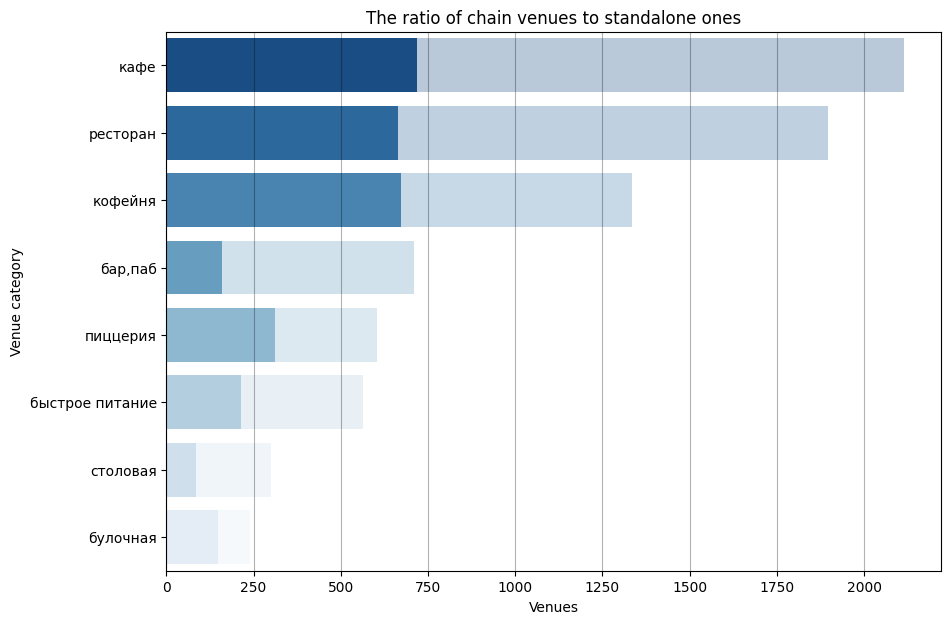

In [121]:
chain = (data_new
         .groupby('category')
         .agg({'chain' : 'sum', 'name' : 'count'})
         .rename(columns = {'name':'total'})
)
chain['percentage'] = round(chain['chain']/chain['total']*100,2)
chain = chain.sort_values(by='total',ascending=False).reset_index()
display(chain)

plt.figure(figsize=(10, 7))

ax = sns.barplot(x='chain', y='category', data=chain, orient='h',palette='Blues_r', alpha=1)
ax1 = sns.barplot(x='total', y='category', data=chain, orient='h',palette='Blues_r', alpha=0.3)
plt.title('The ratio of chain venues to standalone ones')
plt.xlabel('Venues')
plt.ylabel('Venue category')
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x')
plt.show()

**Conclusion**

1. Restaurants and cafes - more than 33% are part of chains;
2. Coffee shops, pizzerias, and bakeries - more than half of them are part of chains.

### Popular venues

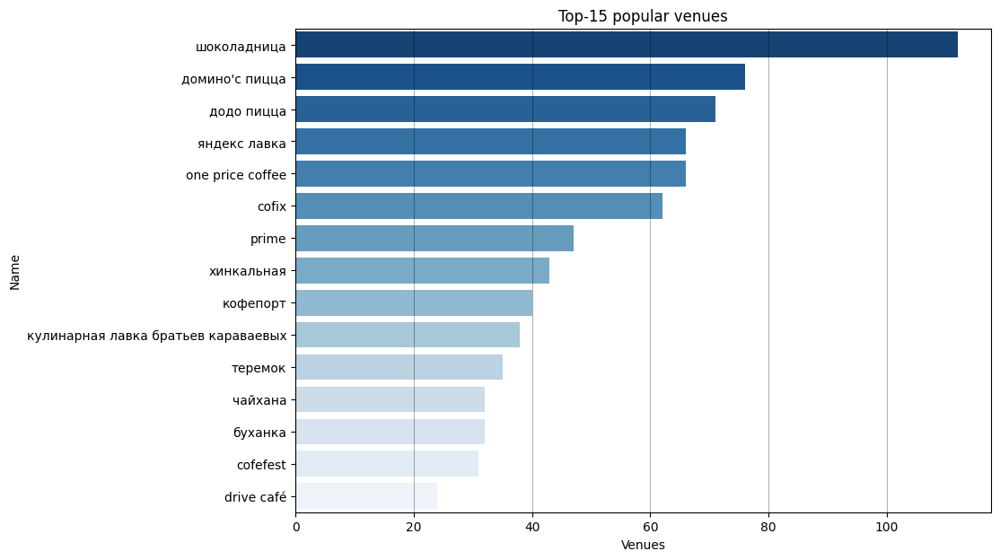

In [122]:
popular_chain = (data_new.query('chain == 1')
                .groupby('name')
                .agg({'chain':'count'})
                .rename(columns = {'chain':'total'})
                .sort_values(by='total',ascending=False)
                .reset_index())
popular_chain.head(15)

plt.figure(figsize=(10, 7))
sns.barplot(x='total', y='name', data=popular_chain.head(15), orient='h',palette='Blues_r', alpha=1)
plt.title('Top-15 popular venues')
plt.xlabel('Venues')
plt.ylabel('Name')
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x')
plt.show()

**Conclusion**

1. The leaders among chain establishments are: "Шоколадница" (Shokoladnitsa), "Доминос" (Domino's), "Додо пицца" (Dodo Pizza), "One price coffre", and "Cofix";
2. Following the previous observation, it can be concluded that the most popular establishments are in the categories of coffee shops, fast food, and cafes;
3. Additionally, it's worth considering the fact that such establishments often serve as meeting places, as their concentration (from personal experience) is often around the flow of city dwellers.

### Locations

In [123]:
print('Dataset`s districts:',data_new['district'].unique())

Dataset`s districts: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


All districts are in Moscow.

In [124]:
by_district = (data_new
              .groupby('district')
              .agg({'name':'count'})
              .rename(columns = {'name':'total'})
              .sort_values(by='total',ascending=False)
              .reset_index())
by_district['percentage'] = round(by_district['total']/by_district['total'].sum()*100,2)
by_district

,district,total,percentage
0,Центральный административный округ,2097,27.00
1,Северный административный округ,833,10.72
2,Северо-Восточный административный округ,821,10.57
3,Южный административный округ,804,10.35
4,Восточный административный округ,749,9.64
5,Западный административный округ,749,9.64
6,Юго-Западный административный округ,675,8.69
7,Юго-Восточный административный округ,657,8.46
8,Северо-Западный административный округ,383,4.93


The majority of establishments are located in the central part of the city, which is an obvious fact.

In [125]:
district_category = data_new.pivot_table(index = 'district',
                                         columns = 'category',
                                         values = 'name',
                                         aggfunc = 'count').reset_index()
district_category

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,44,24,68,242,101,71,159,40
1,Западный административный округ,44,32,57,202,136,66,190,22
2,Северный административный округ,63,35,54,215,183,69,175,39
3,Северо-Восточный административный округ,53,26,78,242,152,65,166,39
4,Северо-Западный административный округ,22,12,28,95,62,40,108,16
5,Центральный административный округ,344,49,80,431,404,105,620,64
6,Юго-Восточный административный округ,38,12,66,238,87,55,137,24
7,Юго-Западный административный округ,38,26,59,217,93,64,161,17
8,Южный административный округ,63,24,75,234,116,70,182,40


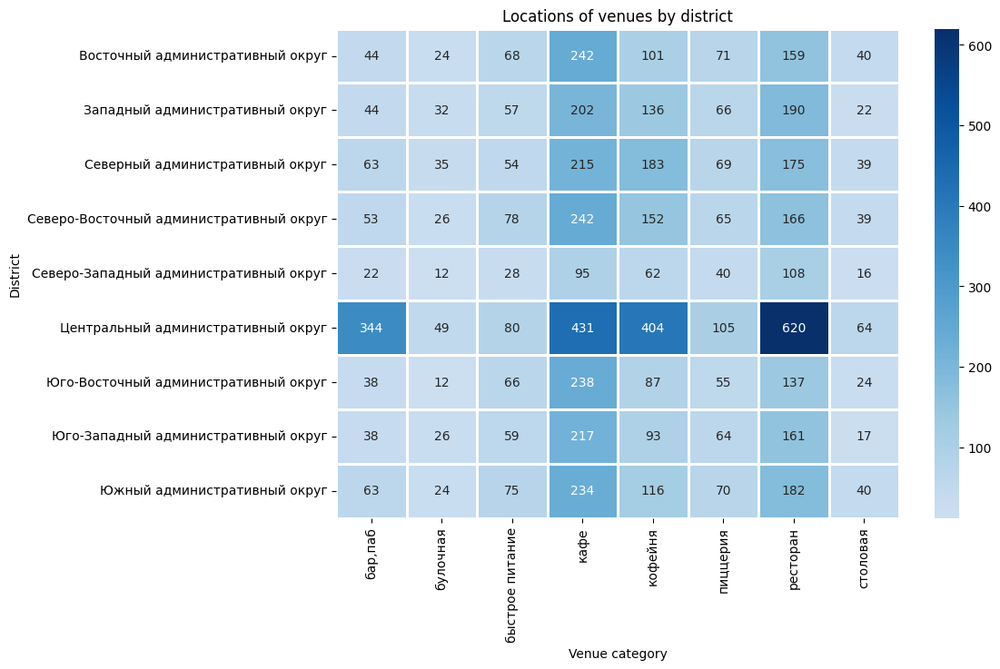

In [126]:
temp1 = district_category[['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']]
temp1
districts = district_category['district']
plt.figure(figsize=(10, 7))
p1 = sns.heatmap(temp1, cmap = "Blues", center = 230, yticklabels=districts, annot=True, linewidths=1, fmt=',.0f')
plt.title('Locations of venues by district')
plt.xlabel('Venue category')
plt.ylabel('District');

**Conclusion**

1. Establishments are primarily concentrated in the central part of the city.
2. There are more restaurants, cafes, coffee shops, and bars/pubs.
3. Bakeries, pizzerias, canteens, and fast food establishments are relatively fewer.
4. If we consider the distribution of categories across districts of the city, a significant portion is concentrated in the central district, while establishments in other districts are roughly evenly distributed, except for the Southeastern and Northwestern administrative districts.

### Venue rating


In [127]:
category_mean_rating = (data_new
                        .groupby('category')
                        .agg({'rating':'mean'})
                        .sort_values(by='rating',ascending=False)
                        .reset_index())
category_mean_rating['rating'] = round(category_mean_rating['rating'],2)
category_mean_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.30
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.22
6,кафе,4.14
7,быстрое питание,4.05


In [128]:
district_category_rating = data_new.pivot_table(index = 'district',
                                         columns = 'category',
                                         values = 'rating',
                                         aggfunc = 'mean').reset_index()
district_category_rating

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,4.340909,4.175000,4.027941,4.133058,4.284158,4.269014,4.191195,4.232500
1,Западный административный округ,4.377273,4.246875,3.947368,4.082178,4.192647,4.278788,4.268421,4.122727
2,Северный административный округ,4.341270,4.277143,4.003704,4.200000,4.298907,4.301449,4.280571,4.228205
3,Северо-Восточный административный округ,4.175472,4.342308,4.021795,4.088843,4.223684,4.266154,4.228313,4.069231
4,Северо-Западный административный округ,4.395455,4.283333,3.960714,4.117895,4.325806,4.337500,4.293519,4.206250
5,Центральный административный округ,4.486047,4.371429,4.271250,4.300696,4.334901,4.420000,4.420806,4.317188
6,Юго-Восточный административный округ,4.200000,4.025000,3.922727,4.071849,4.218391,4.185455,4.168613,4.116667
7,Юго-Западный административный округ,4.350000,4.184615,4.094915,4.036406,4.278495,4.340625,4.250932,4.241176
8,Южный административный округ,4.271429,4.320833,4.082667,4.082906,4.223276,4.261429,4.208242,4.270000


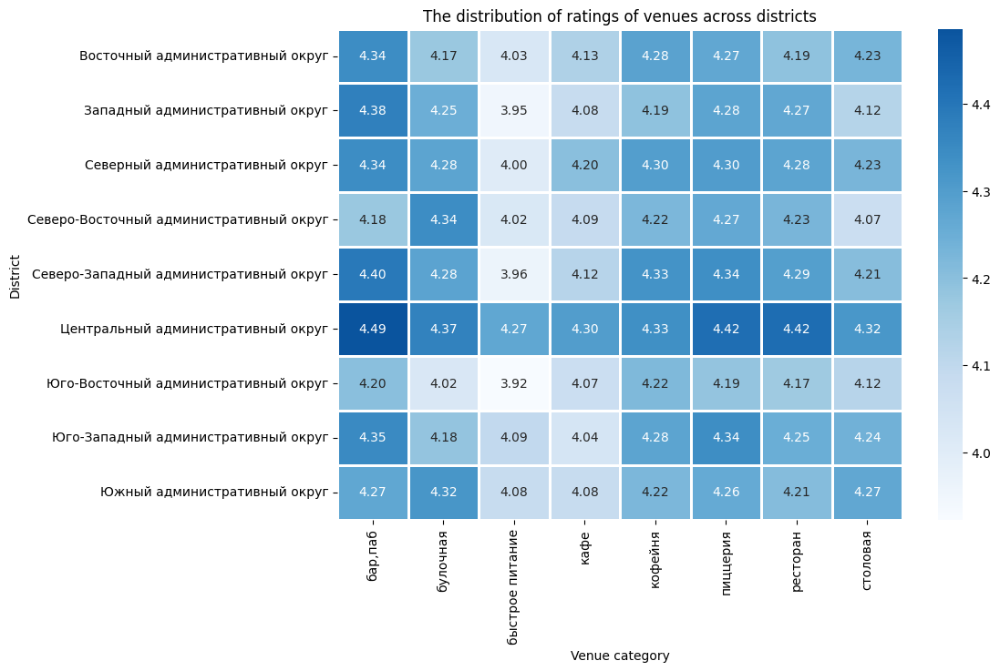

In [129]:
plt.figure(figsize=(10, 7))
temp2 = district_category_rating[['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']]
p1 = sns.heatmap(temp2, cmap = "Blues", center = 4.25, yticklabels=districts, annot=True, linewidths=1, fmt=',.2f')
plt.title('The distribution of ratings of venues across districts')
plt.xlabel('Venue category')
plt.ylabel('District');

### Average rating map

In [130]:
rating_df = data_new.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.187984
1,Западный административный округ,4.182109
2,Северный административный округ,4.249580
3,Северо-Восточный административный округ,4.162363
4,Северо-Западный административный округ,4.237337
5,Центральный административный округ,4.380210
6,Юго-Восточный административный округ,4.114155
7,Юго-Западный административный округ,4.183407
8,Южный административный округ,4.178234


In [131]:
# uploading JSON-file with Moscow borders
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - latitude of the center of Moscow, moscow_lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# making Moscow map
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='cartodbpositron')

# making choropleth with Choropleth tool and adding it on the map
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='AVG rationg by districts',
).add_to(m)


# map view
m

In [132]:
# making empty cluster, adding it on map
marker_cluster = MarkerCluster().add_to(m)

# making function, which accepts DF and
# creating cluster dot in marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# using function create_clusters() for each row
data_new.apply(create_clusters, axis=1)

# map viewing
m

**Conclusion**

1. Ratings of almost all categories of venues are predominantly above 4;
2. The only "outlying" category is fast food venues due to their quantity;
3. The central part of the city outperforms the rest in terms of venues ratings, which is not surprising.

### Top 15 streets by venues



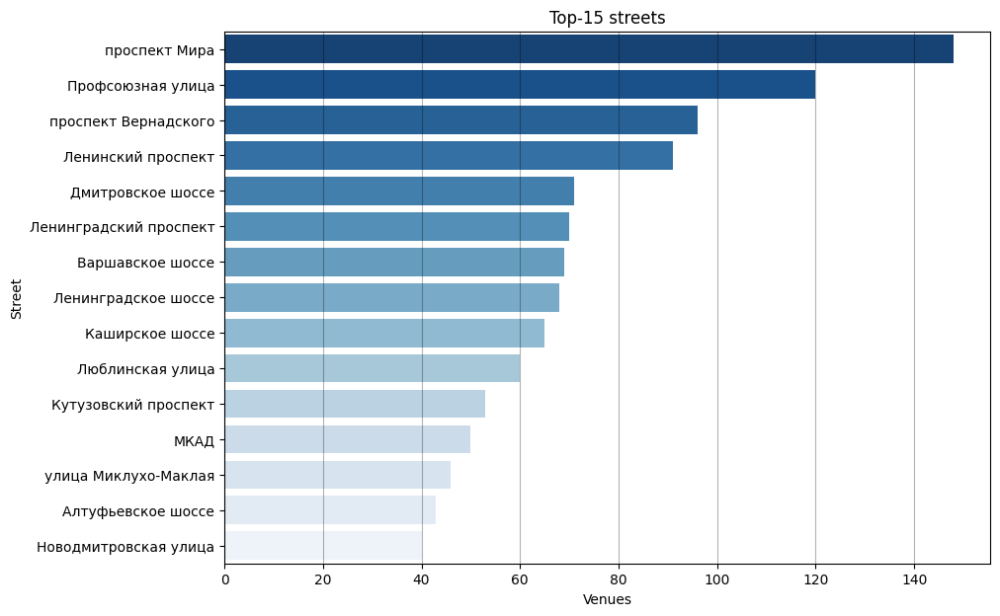

In [133]:
popular_streets = (data_new
                .groupby('street')
                .agg({'name':'count'})
                .rename(columns = {'name':'total'})
                .sort_values(by='total',ascending=False)
                .reset_index())
popular_streets.head(15)

plt.figure(figsize=(10, 7))
sns.barplot(x='total', y='street', data=popular_streets.head(15), orient='h',palette='Blues_r', alpha=1)
plt.title('Top-15 streets')
plt.xlabel('Venues')
plt.ylabel('Street')
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x')
plt.show()

In [134]:
popular_streets.head(15)
popular_15 = popular_streets['street'].head(15)
popular_15 = popular_15.tolist()

In [135]:
data_15_streets = data_new.query('street in @popular_15')
data_15_streets_by_category = data_15_streets.pivot_table(index = 'street',
                                         columns = 'category',
                                         values = 'name',
                                         aggfunc = 'count')
data_15_streets_by_category['sum'] = data_15_streets_by_category.sum(axis='columns')
data_15_streets_by_category = data_15_streets_by_category.sort_values(by='sum', ascending=True).reset_index()
data_15_streets_by_category

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum
0,Новодмитровская улица,3.0,NaN,5.0,12.0,12.0,2.0,5.0,1.0,40.0
1,Алтуфьевское шоссе,4.0,1.0,5.0,11.0,9.0,3.0,9.0,1.0,43.0
2,улица Миклухо-Маклая,3.0,NaN,4.0,19.0,4.0,2.0,14.0,NaN,46.0
3,МКАД,NaN,NaN,8.0,33.0,3.0,NaN,5.0,1.0,50.0
4,Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,2.0,53.0
5,Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0,60.0
6,Каширское шоссе,2.0,NaN,8.0,17.0,13.0,4.0,17.0,4.0,65.0
7,Ленинградское шоссе,5.0,2.0,5.0,12.0,13.0,3.0,25.0,3.0,68.0
8,Варшавское шоссе,6.0,NaN,7.0,17.0,11.0,4.0,17.0,7.0,69.0
9,Ленинградский проспект,13.0,2.0,2.0,7.0,18.0,6.0,20.0,2.0,70.0


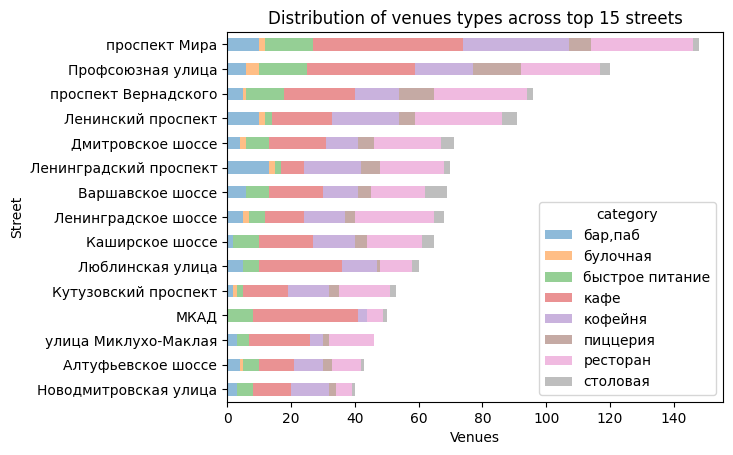

In [136]:
data_15_streets_by_category.loc[:, 'street':'столовая'].plot(x='street', kind='barh', stacked=True,
        title='Distribution of venues types across top 15 streets', alpha=0.5)
plt.xlabel('Venues')
plt.ylabel('Street')
plt.show()


Cheking streets with only one venue

In [137]:
only_one = popular_streets.query('total == 1')
only_one_list = only_one['street'].tolist()

In [138]:
only1 = data_new.query("street in @only_one_list")
only1

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
19,пекарня,булочная,"москва, ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,Ижорский проезд,True
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
55,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7660,wtfcoffee,кофейня,"москва, улица артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False
7682,беседка,кафе,"москва, кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
7739,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,Грайвороновская улица,False
7742,лагман хаус,кафе,"москва, новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


Creating map of 1 venue per street

In [139]:
# creating map of 1 venue per street
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m4)

marker_cluster = MarkerCluster().add_to(m4)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

only1.apply(create_clusters, axis=1)

m4

**Conclusion**

1.   Long streets have more venues;
2.   Generally, venues are concentrated on busy streets, as a necessary condition for profitability is high foot traffic.

### Median bill




In [140]:
med_bill_district = (data_new
                     .groupby('district')
                     .agg({'middle_avg_bill':'median'})
                     .rename(columns = {'middle_avg_bill':'median'})
                     .sort_values(by='median',ascending=False)).reset_index()
med_bill_district

,district,median
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,687.5
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,550.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,444.5


In [141]:
# making map of Moscow with median bill by districts
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='cartodbpositron')

Choropleth(
    geo_data=state_geo,
    data=med_bill_district,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='Median avg bill',
).add_to(m1)

m1

**Conclusion**

1.   The average bill includes the cost of rent and other expenses, so the more expensive the district, the higher the average bill;
2.   The most expensive districts are the Central Administrative District (ЦАО) and the Western Administrative District (ЗАО);
3.   The less expensive districts are residential or industrial ones: the Southeastern Administrative District (ЮВАО), the Southern Administrative District (ЮВО), and the Northern Administrative District (САО).

## Detailed abalysis: **Opening a Coffee Shop**

How many coffee shops in Dataset

In [142]:
coffee = data_new.query('category == "кофейня"')
print('Coffee shops:', len(coffee))

Coffee shops: 1334


The features of their arrangement

In [143]:
coffee_by_district = (coffee
                      .groupby('district')
                      .agg({'name':'count'})
                      .sort_values(by='name', ascending=False)).reset_index()

coffee_by_district['district'] = coffee_by_district['district'].str.split().str[0]
coffee_by_district['percentage'] = round(coffee_by_district['name']/coffee_by_district['name'].sum()*100,2)
coffee_by_district

,district,name,percentage
0,Центральный,404,30.28
1,Северный,183,13.72
2,Северо-Восточный,152,11.39
3,Западный,136,10.19
4,Южный,116,8.70
5,Восточный,101,7.57
6,Юго-Западный,93,6.97
7,Юго-Восточный,87,6.52
8,Северо-Западный,62,4.65


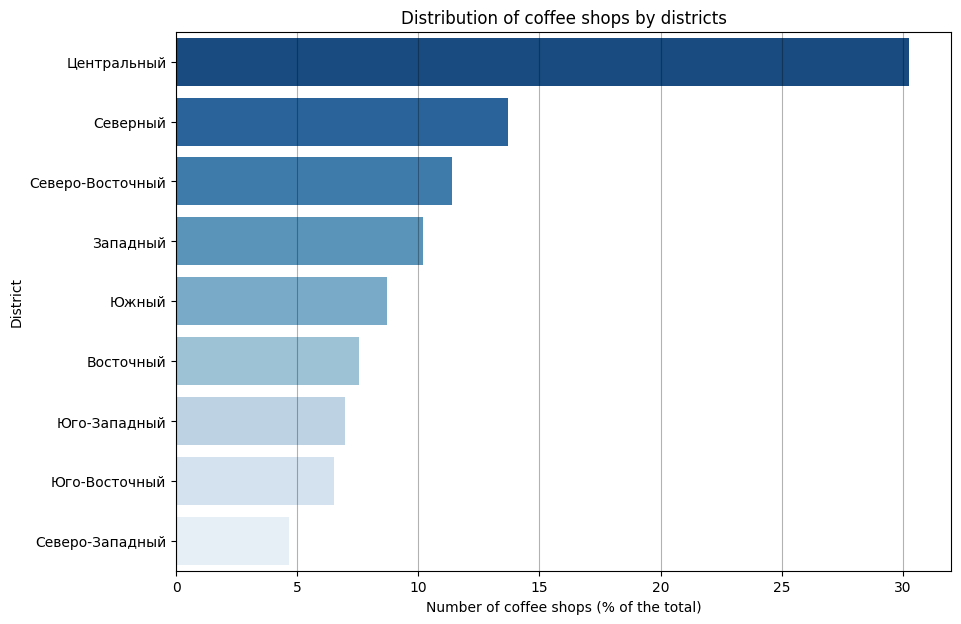

In [144]:
plt.figure(figsize=(10, 7))
sns.barplot(x='percentage', y='district', data=coffee_by_district, orient='h',palette='Blues_r', alpha=1)
plt.title('Distribution of coffee shops by districts')
plt.xlabel('Number of coffee shops (% of the total)')
plt.ylabel('District')
plt.xlim(0,32)
plt.grid(which='major',
       color = 'black',
       alpha=0.3,
       axis = 'x')
plt.show()

**Conclusion**

Coffee shops are predominantly located in the Central Administrative District (ЦАО), Northern Administrative District (САО), Northeastern Administrative District (СВАО), and Western Administrative District (ЗАО) - areas known for being upscale or mid-priced in terms of pricing.

Ratings at coffee shops, average bill, and seats by districts

In [145]:
coffee_avg_all = (coffee
                      .groupby('district')
                      .agg({'name':'count','middle_coffee_cup':['mean','median'],'rating':'mean', 'seats':'median'})
                      .sort_values(by=('name','count'),ascending=False)).reset_index()
coffee_avg_all

district  name middle_coffee_cup         \
                                           count              mean median   
0       Центральный административный округ   404        187.146497  190.0   
1          Северный административный округ   183        168.101449  160.0   
2  Северо-Восточный административный округ   152        167.758621  166.0   
3          Западный административный округ   136        187.688889  185.0   
4             Южный административный округ   116        155.923077  144.0   
5         Восточный административный округ   101        174.609756  135.0   
6      Юго-Западный административный округ    93        184.176471  198.0   
7     Юго-Восточный административный округ    87        152.787879  150.0   
8   Северо-Западный административный округ    62        165.523810  165.0   

     rating  seats  
       mean median  
0  4.334901   80.0  
1  4.298907   58.0  
2  4.223684   72.5  
3  4.192647   80.0  
4  4.223276   50.0  
5  4.284158   52.0  
6  4.278495   64.0  
7  4.218391   50.0  
8  4.325806   87.5

Detailed location on the map

In [146]:
coffee_avg_bill = (coffee
                      .groupby('district')
                      .agg({'middle_coffee_cup':'mean'})
                      .sort_values(by='middle_coffee_cup',ascending=False)).reset_index()

In [147]:
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_avg_bill,
    columns=['district','middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='AVG bill of coffee shop',
).add_to(m3)

marker_cluster = MarkerCluster().add_to(m3)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_coffee_cup']}",
    ).add_to(marker_cluster)

coffee.apply(create_clusters, axis=1)

m3

In [148]:
print('Average price of a cup of coffee in Moscow:', round(coffee['middle_coffee_cup'].mean()),'RUB')

Average price of a cup of coffee in Moscow: 175 RUB


**Conclusion**

1. The average price of a cup of coffee by districts is relatively consistent (with a difference of 30 rubles).
2. The average price of a cup of coffee across Moscow is 175 rubles.

24/7 coffee shops

In [149]:
print('24/7 coffee shops:',len(coffee.query('is_24_7 == True')))

24/7 coffee shops: 58


In [150]:
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_avg_bill,
    columns=['district','middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='AVG bill of coffee shop',
).add_to(m5)

marker_cluster = MarkerCluster().add_to(m5)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_coffee_cup']}",
    ).add_to(marker_cluster)

coffee.query('is_24_7 == True').apply(create_clusters, axis=1)

m5

**Conclusion**

24-hour venues are present. They are predominantly situated along avenues, highways, and transportation hubs. The reason for this is the continuous flow of vehicles around the clock.

## Overall Conclusion

****


The dataset containing venues in Moscow was analyzed.

**As a result of preprocessing:**

1. A column with street names was created.
2. A categorical column indicating 24/7 operation was added.
3. An upper limit of 250 seating places for the investigated data was defined.
4. Rows without filled columns for operating hours, average check, and seating capacity were removed.
5. Rows with implicit duplicates in the venue name-address pair were eliminated.

**Data analysis revealed:**

1. There are a total of 7 types of venues. The top three types by quantity are cafes, restaurants, and coffee shops.
2. The median seating capacity ranges from 48 to 80.
3. More than 33% of restaurants and cafes are chains. More than half of coffee shops, pizzerias, and bakeries are chains.
4. Leading chain venues include "Shokoladnitsa," "Domino's," "Dodo Pizza," "One Price Coffee," and "Cofix." The majority of popular venues in categories like coffee shops, fast food, and cafes fall into this group. These venues serve as meeting places due to their concentration around urban flows.
5. Venues are primarily concentrated in the central part of the city, with a higher presence of restaurants, cafes, coffee shops, and bars/pubs. Bakeries, pizzerias, canteens, and fast-food places are comparatively less common.
6. If we consider the distribution of categories across city districts, a significant portion is concentrated in the central district, and venues are roughly equally distributed in other districts, except for the Southeastern (ЮВ) and Northwestern (СЗ) administrative districts, where they are less common.
7. Ratings for almost all categories of venues are generally high. The only "outlier" is the fast-food category due to its higher quantity. The central part of the city outperforms others in venue ratings, which is not surprising.
8. Longer streets tend to have more venues. venues are primarily concentrated on busy streets, as foot traffic is essential for profitability.
9. The average check includes rent and other expenses, thus pricier districts have higher average checks. The most expensive districts are Central Administrative District (ЦАО) and Western Administrative District (ЗАО). Less expensive districts are residential or industrial, such as Southeastern (ЮВАО), Southern (ЮВО), and Northern (САО) administrative districts.

**Coffee Shops**

1. A total of 1334 coffee shops were analyzed.
2. Coffee shops are predominantly located in the Central Administrative District (ЦАО), Northern Administrative District (САО), Northeastern Administrative District (СВАО), and Western Administrative District (ЗАО), known for higher or mid-range pricing.
3. The average price of a cup of coffee by districts ranges from 150 to 190 rubles, with an overall city average of 175 rubles.

**Detailed Coffee Shop Opening**

1. Attention should be given to location.
2. The location will influence the coffee price.
3. The client is not afraid of competition.

Based on the three factors for opening a coffee shop: location in the Central Administrative District (any part), Northern Administrative District (САО), Northeastern Administrative District (СВАО), or Western Administrative District (ЗАО) closer to the center. In simpler terms, where foot traffic is high.

Consequently, if the coffee shop is situated closer to the central part of the city, the average coffee price would be around 190 rubles.

Preferred coffee shop size is roughly 40 to 60 seating places.